# Lab | Customer Analysis Final Round


For this lab, we still keep using the marketing_customer_analysis.csv file that you can find in the files_for_lab folder.

It's time to put it all together. Remember the previous rounds and follow the steps as shown in previous lectures.

## 01 - Problem (case study)

- Data Description.

- Goal.

In [2]:
# Data from a customer analysis of a car ensurance
# The objective is to create a prediction model to find out if and how well the total claim amount can be predicted by other information avalible about the customer 

## 02 - Getting Data

Read the .csv file.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import norm
from scipy.special import inv_boxcox
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder, Normalizer, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import os
import math
import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = None

data = pd.read_csv('files_for_lab/csv_files/marketing_customer_analysis.csv')
data

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.234764,Four-Door Car,Medsize
9130,PK87824,California,3096.511217,Yes,Extended,College,2/12/11,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.200000,Four-Door Car,Medsize
9131,TD14365,California,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.784983,Four-Door Car,Medsize
9132,UP19263,California,7524.442436,No,Extended,College,2/3/11,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.200000,Four-Door Car,Large


## 03 - Cleaning/Wrangling/EDA

- Change headers names.
- Deal with NaN values.
- Categorical Features.
- Numerical Features.
- Exploration.

In [4]:
#Change header names
def clean_headers(df):
    df.rename(columns={'Customer':'id', 'EmploymentStatus':'employment_status'}, inplace=True)
    df.columns = df.columns.str.lower().str.strip().str.replace(' ', '_')
    return df
clean_headers(data)

,id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.234764,Four-Door Car,Medsize
9130,PK87824,California,3096.511217,Yes,Extended,College,2/12/11,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.200000,Four-Door Car,Medsize
9131,TD14365,California,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.784983,Four-Door Car,Medsize
9132,UP19263,California,7524.442436,No,Extended,College,2/3/11,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.200000,Four-Door Car,Large


In [5]:
#check for duplicates in column customer id
data.duplicated(subset=['id']).unique()

array([False])

In [6]:
data['id'].value_counts() #no duplicates in column id

LM37855    1
IN78205    1
GB47529    1
YN46118    1
WW68250    1
          ..
KZ80383    1
CR37971    1
UA26783    1
FY73682    1
BA51898    1
Name: id, Length: 9134, dtype: int64

In [7]:
#check for Nall values -> none.
data.isna().sum()

id                               0
state                            0
customer_lifetime_value          0
response                         0
coverage                         0
education                        0
effective_to_date                0
employment_status                0
gender                           0
income                           0
location_code                    0
marital_status                   0
monthly_premium_auto             0
months_since_last_claim          0
months_since_policy_inception    0
number_of_open_complaints        0
number_of_policies               0
policy_type                      0
policy                           0
renew_offer_type                 0
sales_channel                    0
total_claim_amount               0
vehicle_class                    0
vehicle_size                     0
dtype: int64

In [8]:
#check categorical data

cat = data.select_dtypes('object')
cat

,id,state,response,coverage,education,effective_to_date,employment_status,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,No,Basic,Bachelor,2/10/11,Employed,M,Urban,Married,Personal Auto,Personal L1,Offer2,Web,Four-Door Car,Medsize
9130,PK87824,California,Yes,Extended,College,2/12/11,Employed,F,Suburban,Divorced,Corporate Auto,Corporate L3,Offer1,Branch,Four-Door Car,Medsize
9131,TD14365,California,No,Extended,Bachelor,2/6/11,Unemployed,M,Suburban,Single,Corporate Auto,Corporate L2,Offer1,Branch,Four-Door Car,Medsize
9132,UP19263,California,No,Extended,College,2/3/11,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer3,Branch,Four-Door Car,Large


In [9]:
# check uniques in categoricals -> already cleaned
for column in cat.columns:
    print(column, cat[column].unique())

id ['BU79786' 'QZ44356' 'AI49188' ... 'TD14365' 'UP19263' 'Y167826']
state ['Washington' 'Arizona' 'Nevada' 'California' 'Oregon']
response ['No' 'Yes']
coverage ['Basic' 'Extended' 'Premium']
education ['Bachelor' 'College' 'Master' 'High School or Below' 'Doctor']
effective_to_date ['2/24/11' '1/31/11' '2/19/11' '1/20/11' '2/3/11' '1/25/11' '1/18/11'
 '1/26/11' '2/17/11' '2/21/11' '1/6/11' '2/6/11' '1/10/11' '1/17/11'
 '1/5/11' '2/27/11' '1/14/11' '1/21/11' '2/5/11' '1/29/11' '2/28/11'
 '2/12/11' '2/2/11' '2/7/11' '1/22/11' '2/13/11' '1/15/11' '1/8/11'
 '1/11/11' '1/28/11' '2/8/11' '2/23/11' '1/2/11' '2/16/11' '1/27/11'
 '1/23/11' '1/9/11' '2/11/11' '2/4/11' '2/1/11' '2/15/11' '2/26/11'
 '1/16/11' '1/1/11' '2/10/11' '1/24/11' '2/25/11' '1/12/11' '2/9/11'
 '1/19/11' '1/4/11' '2/14/11' '2/20/11' '2/18/11' '1/3/11' '1/13/11'
 '1/30/11' '2/22/11' '1/7/11']
employment_status ['Employed' 'Unemployed' 'Medical Leave' 'Disabled' 'Retired']
gender ['F' 'M']
location_code ['Suburban' 'Rural' '

In [11]:
""""
#cleaning column examples 

data['customer_lifetime_value'] = data['customer_lifetime_value'].apply(lambda x: float(str(x).replace('%', '')))

def clean_gender(x):
    if str(x).lower().startswith('m'):
        return 'M'
    elif str(x).lower().startswith('f'):
        return 'F'
    else:
        return 'O'

data['gender'] = data['gender'].apply(clean_gender)

data['state'] = data['state'].apply(lambda x: 'California' if str(x).lower().startswith('cal')
                                                 else 'Nevada' if x == 'NV'
                                                 else 'Arizona' if x == 'AZ'
                                                 else x)
""""""

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-11-eb8740b7ef3a>, line 20)

In [12]:

""" 
# replacing NaN values 

def clean_df(df):
    replace_dict = {
        'id': '',
        'state': 'California',
        'customer_lifetime_value': '',
        'response': 'No',
        'coverage': '',
        'education': '',
        'effective_to_date': '',
        'employment_status': '',
        'gender': '',
        'income': '',
        'location_code': '',
        'marital_status': '',
        'monthly_premium_auto': '',
        'months_since_last_claim': df['months_since_last_claim'].median(),
        'months_since_policy_inception': '',
        'number_of_open_complaints': df['number_of_open_complaints'].median(),
        'number_of_policies': '',
        'policy_type': '',
        'policy': '',
        'renew_offer_type': '',
        'sales_channel': '',
        'total_claim_amount': '',
        'vehicle_class': 'Four-Door Car',
        'vehicle_size': 'Medsize',
        'vehicle_type': 'A',  
    }
    
    for column in df.columns:
        df[column] = df[column].fillna(replace_dict[column])

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-12-fd0b27029fab>, line 34)

In [13]:
#check numerical data
#select numericals and plot distplots
data.select_dtypes(np.number)

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,2763.519279,56274,69,32,5,0,1,384.811147
1,6979.535903,0,94,13,42,0,8,1131.464935
2,12887.431650,48767,108,18,38,0,2,566.472247
3,7645.861827,0,106,18,65,0,7,529.881344
4,2813.692575,43836,73,12,44,0,1,138.130879
...,...,...,...,...,...,...,...,...
9129,23405.987980,71941,73,18,89,0,2,198.234764
9130,3096.511217,21604,79,14,28,0,1,379.200000
9131,8163.890428,0,85,9,37,3,2,790.784983
9132,7524.442436,21941,96,34,3,0,3,691.200000


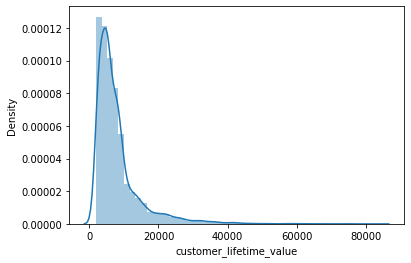

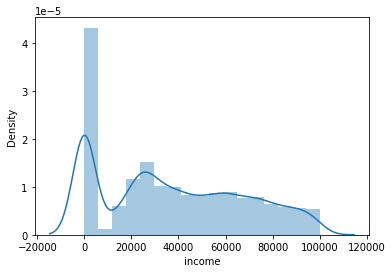

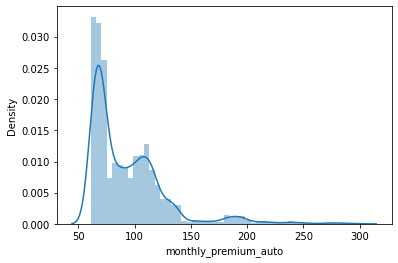

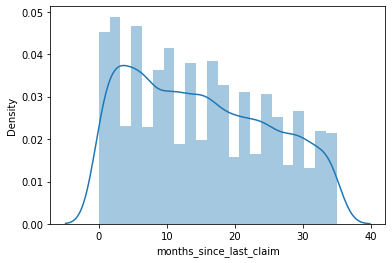

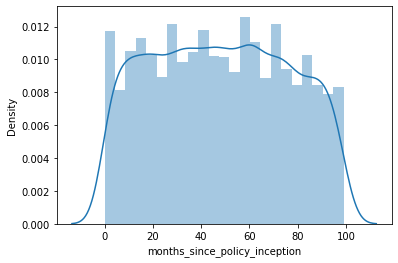

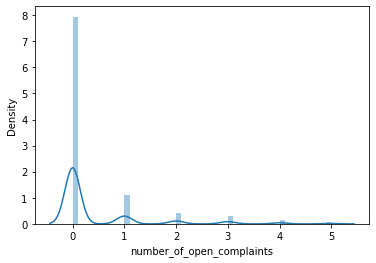

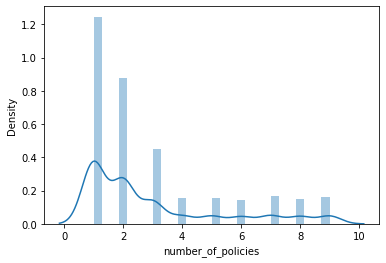

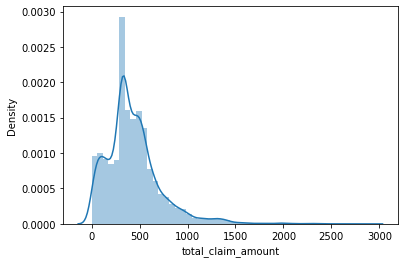

In [14]:
for column in data.select_dtypes(np.number).columns:
    sns.distplot(data[column])
    plt.show()

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_lifetime_value,9134.0,8004.940475,6870.967608,1898.007675,3994.251794,5780.182197,8962.167041,83325.381190
income,9134.0,37657.380009,30379.904734,0.000000,0.000000,33889.500000,62320.000000,99981.000000
monthly_premium_auto,9134.0,93.219291,34.407967,61.000000,68.000000,83.000000,109.000000,298.000000
months_since_last_claim,9134.0,15.097000,10.073257,0.000000,6.000000,14.000000,23.000000,35.000000
months_since_policy_inception,9134.0,48.064594,27.905991,0.000000,24.000000,48.000000,71.000000,99.000000
number_of_open_complaints,9134.0,0.384388,0.910384,0.000000,0.000000,0.000000,0.000000,5.000000
number_of_policies,9134.0,2.966170,2.390182,1.000000,1.000000,2.000000,4.000000,9.000000
total_claim_amount,9134.0,434.088794,290.500092,0.099007,272.258244,383.945434,547.514839,2893.239678


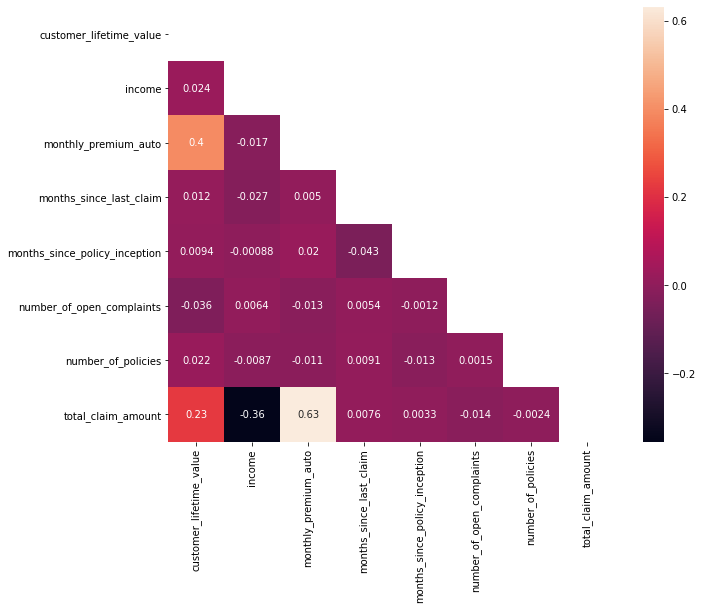

In [16]:
#check correlations 
mask = np.zeros_like(data.corr())

mask[np.triu_indices_from(mask)] = True # optional, to hide repeat half of the matrix

fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(data.corr(), mask=mask, annot=True)
plt.show()
# no correlation above 0,9, no deletion 
# when removing columns, keep the ones that have the highest correlation with target

In [17]:
# modeling before any data changes to compare again modeling after changes
# possible feature selection based on P values < 0.05

data_num = data.select_dtypes(include=[np.number])

ols1_x = data_num.drop(['total_claim_amount'], axis=1)
ols1_y = data['total_claim_amount']
ols1_x = sm.add_constant(ols1_x)

ols1_model = sm.OLS(ols1_y,ols1_x).fit()
print(ols1_model.summary())

                            OLS Regression Results                            
Dep. Variable:     total_claim_amount   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     1405.
Date:                Thu, 17 Jun 2021   Prob (F-statistic):               0.00
Time:                        18:45:49   Log-Likelihood:                -61425.
No. Observations:                9134   AIC:                         1.229e+05
Df Residuals:                    9126   BIC:                         1.229e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [18]:
#check R2, RMSE, MSE, MAE before normalizing 
lm1_x = data_num.drop(['total_claim_amount'], axis=1)
lm1_y = data['total_claim_amount'] 

lm1 = LinearRegression()
lm1_model = lm1.fit(lm1_x,lm1_y)

lm1_predictions = lm1.predict(lm1_x)
lm1_r2 = round(r2_score(lm1_y, lm1_predictions),2)
lm1_rmse = mean_squared_error(lm1_y, lm1_predictions, squared=False)
lm1_mse = mean_squared_error(lm1_y, lm1_predictions, squared=True)
lm1_mae = mean_absolute_error(lm1_y, lm1_predictions)

print("R2:", lm1_r2)
print("RMSE:", lm1_rmse)
print("MSE:", lm1_mse)
print("MAE:", lm1_mae)

R2: 0.52
RMSE: 201.53347925902824
MSE: 40615.74326224916
MAE: 144.382900742772


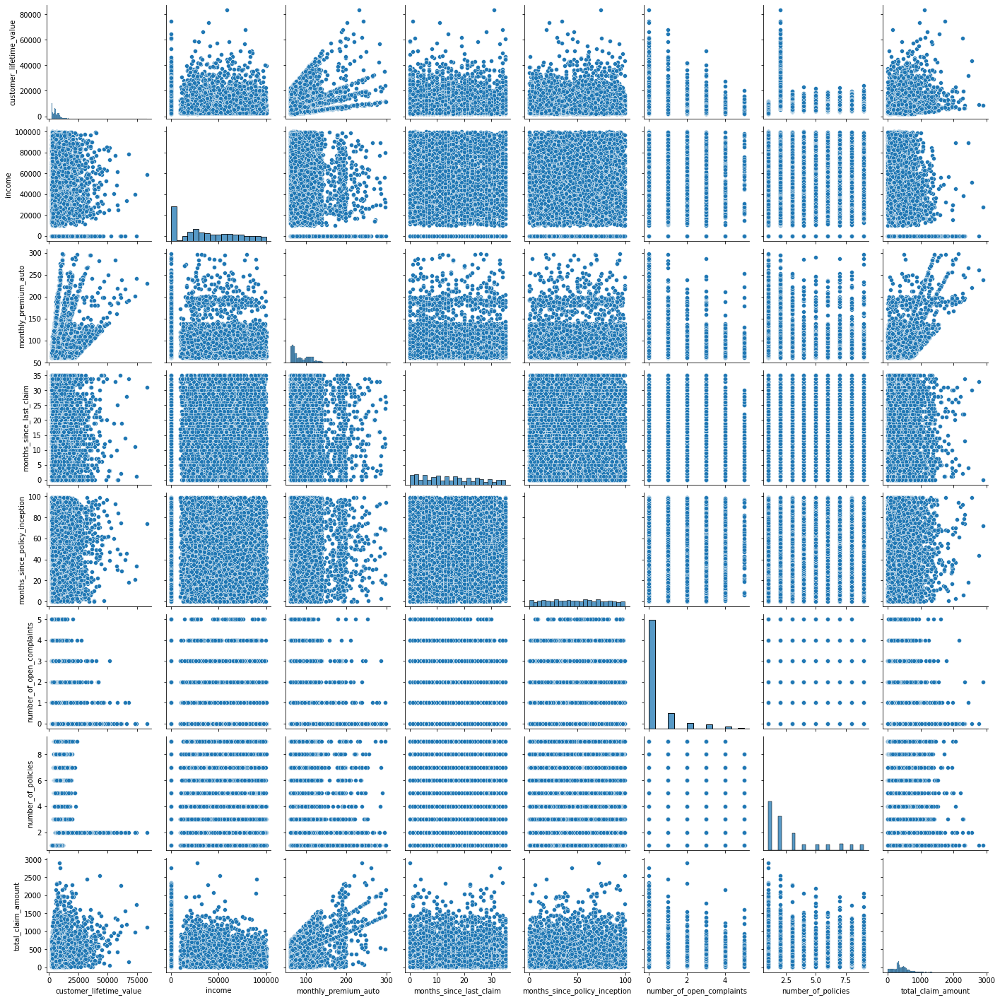

In [19]:
sns.pairplot(data)

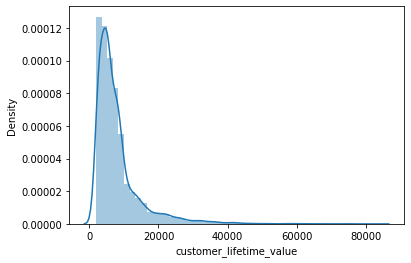

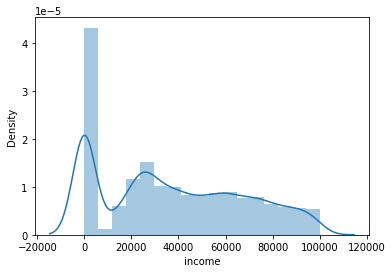

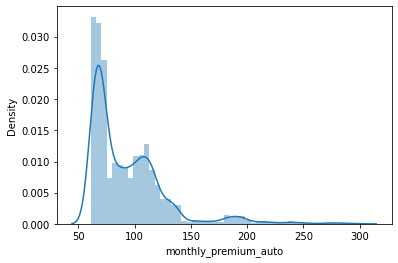

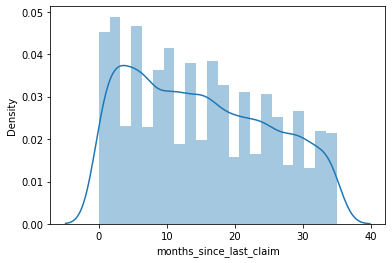

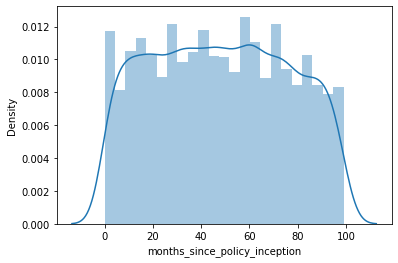

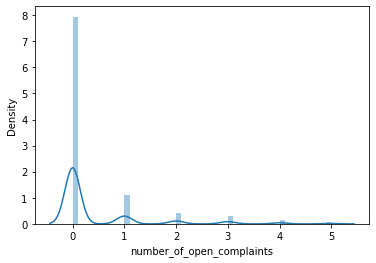

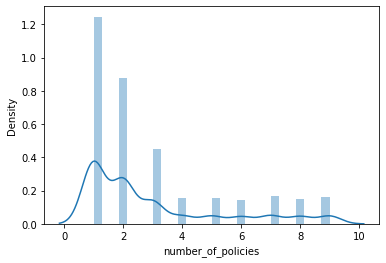

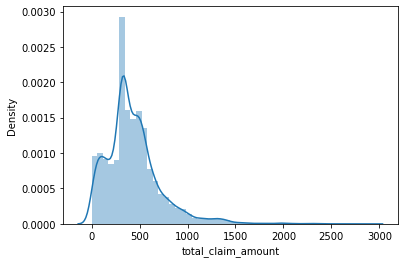

In [20]:
for column in data_num:
    sns.distplot(data[column])
    plt.show()

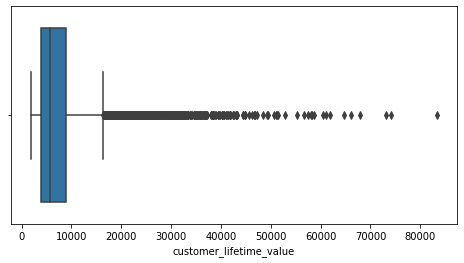

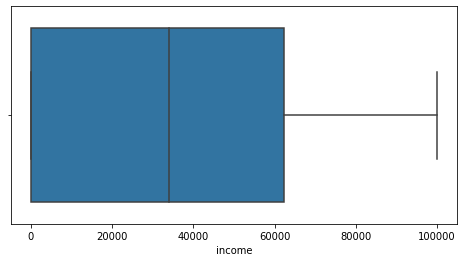

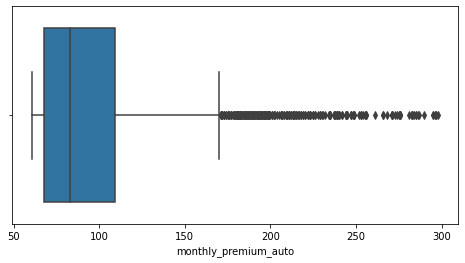

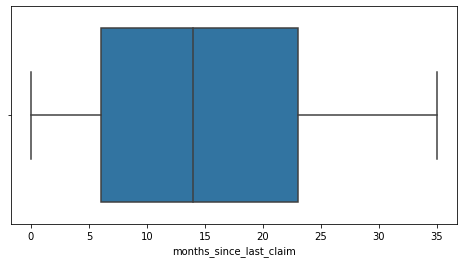

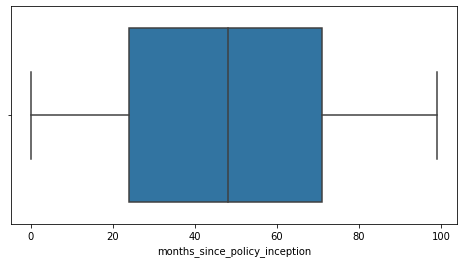

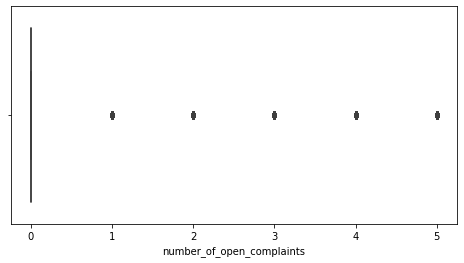

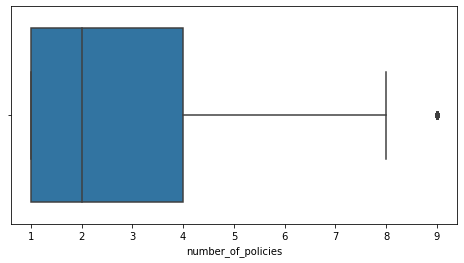

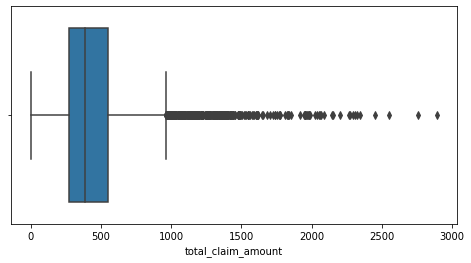

In [21]:
for column in data_num:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=data[column])
    plt.show()

## 04 - Processing Data

- Dealing with outliers.
- Normalization.
- Encoding Categorical Data.
- Splitting into train set and test set.

In [22]:
# checking for values <= 0 and replacing them before tranforming
for col in data_num:
    neg_val = len(data[data[col] < 0])
    zero_val = len(data[data[col] == 0])
     
    if neg_val > 0:
        print('Negative values in', col, ':', neg_val)
    elif zero_val > 0:
        print('Zeros in', col, ':', zero_val)
    else:
        print('Column', col, 'is ok.')
        
print(data_num)

Column customer_lifetime_value is ok.
Zeros in income : 2317
Column monthly_premium_auto is ok.
Zeros in months_since_last_claim : 314
Zeros in months_since_policy_inception : 83
Zeros in number_of_open_complaints : 7252
Column number_of_policies is ok.
Column total_claim_amount is ok.
      customer_lifetime_value  income  monthly_premium_auto  \
0                 2763.519279   56274                    69   
1                 6979.535903       0                    94   
2                12887.431650   48767                   108   
3                 7645.861827       0                   106   
4                 2813.692575   43836                    73   
...                       ...     ...                   ...   
9129             23405.987980   71941                    73   
9130              3096.511217   21604                    79   
9131              8163.890428       0                    85   
9132              7524.442436   21941                    96   
9133              26

In [23]:
# replacing values <= 0

def positive_values(df, in_columns=df.select_dtypes(np.number).columns, skip_columns=[]):
    for col in in_columns:
        if col not in skip_columns:
            df[col] = np.where(df[col] <= 0, df[col].median(), df[col])
    return df

#why this error? should work

NameError: name 'df' is not defined

In [24]:
from scipy import stats
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import math
from sklearn.preprocessing import OneHotEncoder, Normalizer, LabelEncoder
from sklearn.model_selection import train_test_split

In [25]:

# you can decide to remove outliers after log / boxcox transformation
# since these might take care of some outliers for you.
#so first: BoxCox transformation, then spli
#I made a boxcox transformation to normalize the numerical data
def boxcox_transform(data): #give function the the input dataframe df
    numeric_cols = data.select_dtypes(np.number).columns #select numeric columns
    _ci = {column: None for column in numeric_cols} #creating dictionary which contains all columns and none value) key = column name
    for column in numeric_cols:
        # since i know any columns should take negative numbers, to avoid -inf in df
        data[column] = np.where(data[column]<=0, np.NAN, data[column]) #replace all non positive (negative) values with NAN, else keep value as it is
        data[column] = data[column].fillna(data[column].mean()) #whereever I have NAN values now, fill up with mean
        transformed_data, ci = stats.boxcox(data[column])  #boxcox transformation; gives back transformed data and lambda, no choice here
        data[column] = transformed_data #overwriting the colum with transformed data 
        _ci[column] = [ci] #store lambda in dictionary, does not actually make sense but shows that there not only one lambda for all the columns
    return data, _ci  #function return transformed data frame + dictionary with lambda values



In [26]:
data, _ci = boxcox_transform(data)
data

,id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2.703839,No,Basic,Bachelor,2/24/11,Employed,F,1247.937066,Suburban,Married,0.685347,10.876059,3.017887,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Agent,33.035752,Two-Door Car,Medsize
1,QZ44356,Arizona,2.754926,No,Extended,Bachelor,1/31/11,Unemployed,F,1167.961720,Suburban,Single,0.685871,5.808248,18.780377,0.648045,1.424359,Personal Auto,Personal L3,Offer3,Agent,56.357614,Four-Door Car,Medsize
2,AI49188,Nevada,2.780772,No,Premium,Bachelor,2/19/11,Employed,F,1144.063081,Suburban,Married,0.686039,7.347815,17.389171,0.648045,0.607328,Personal Auto,Personal L3,Offer1,Agent,40.071789,Two-Door Car,Medsize
3,WW63253,California,2.759125,No,Basic,Bachelor,1/20/11,Unemployed,M,1167.961720,Suburban,Married,0.686018,7.347815,26.160800,0.648045,1.363462,Corporate Auto,Corporate L2,Offer1,Call Center,38.763252,SUV,Medsize
4,HB64268,Washington,2.704995,No,Basic,Bachelor,2/3/11,Employed,M,1072.375744,Rural,Single,0.685461,5.471294,19.461641,0.648045,0.000000,Personal Auto,Personal L1,Offer1,Agent,19.560154,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,2.801170,No,Basic,Bachelor,2/10/11,Employed,M,1448.531450,Urban,Married,0.685461,7.347815,33.090025,0.648045,0.607328,Personal Auto,Personal L1,Offer2,Web,23.588905,Four-Door Car,Medsize
9130,PK87824,California,2.711030,Yes,Extended,College,2/12/11,Employed,F,697.790558,Suburban,Divorced,0.685606,6.134207,13.709541,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Branch,32.792951,Four-Door Car,Medsize
9131,TD14365,California,2.762062,No,Extended,Bachelor,2/6/11,Unemployed,M,1167.961720,Suburban,Single,0.685725,4.379465,17.034934,1.176115,0.607328,Corporate Auto,Corporate L2,Offer1,Branch,47.263726,Four-Door Car,Medsize
9132,UP19263,California,2.758397,No,Extended,College,2/3/11,Employed,M,704.383672,Suburban,Married,0.685898,11.319628,1.667871,0.648045,0.893486,Personal Auto,Personal L2,Offer3,Branch,44.225147,Four-Door Car,Large


In [27]:
_ci #lambda values of the columns

{'customer_lifetime_value': [-0.3460077279198611],
 'income': [0.606136983521106],
 'monthly_premium_auto': [-1.4560475713521648],
 'months_since_last_claim': [0.5692435567708527],
 'months_since_policy_inception': [0.7136590106846658],
 'number_of_open_complaints': [0.12272161798485684],
 'number_of_policies': [-0.39015686286007867],
 'total_claim_amount': [0.4718167582845637]}

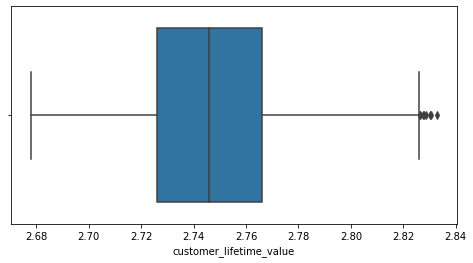

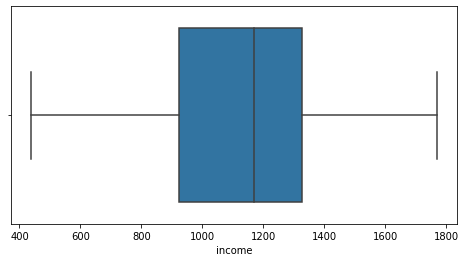

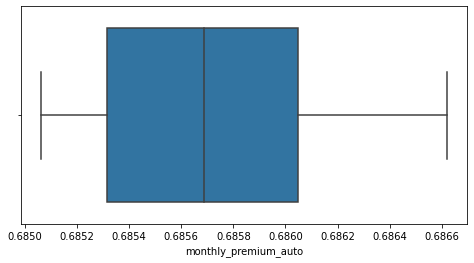

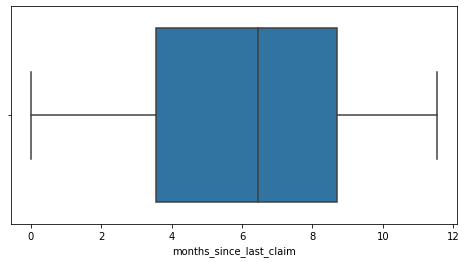

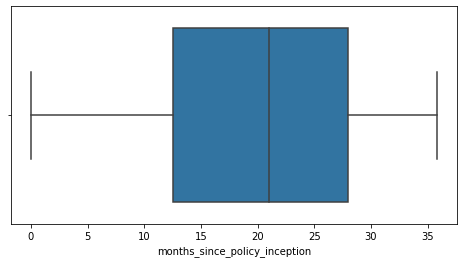

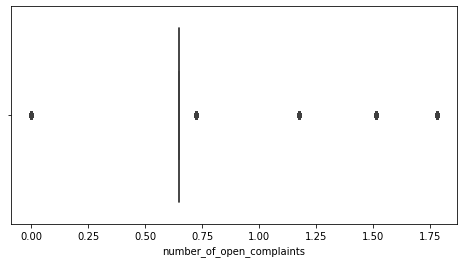

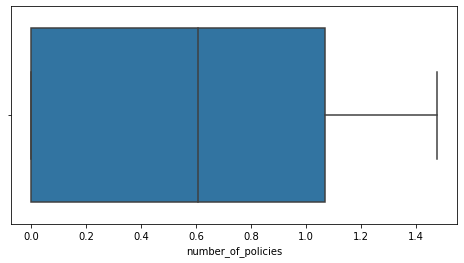

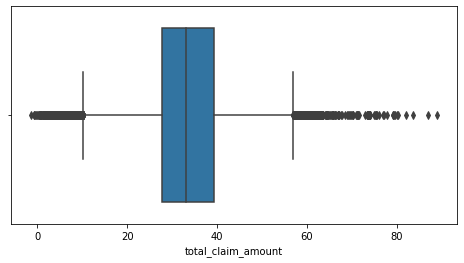

In [28]:
#check for outliers with boxplot 
for column in data.select_dtypes(np.number).columns:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=data[column])
    plt.show()
#remove outliers in customer_lifetime_value, not in total_claim amount to dont mess up target value 

In [29]:
outliers = ['customer_lifetime_value']

for column in outliers:
    iqr = np.percentile(data[column],75) - np.percentile(data[column],25)
    upper_limit = np.percentile(data[column],75) + 1.5*iqr
    lower_limit = np.percentile(data[column],25) - 1.5*iqr
    data.loc[data[column] > upper_limit, column] = upper_limit
    data.loc[data[column] < lower_limit, column] = lower_limit

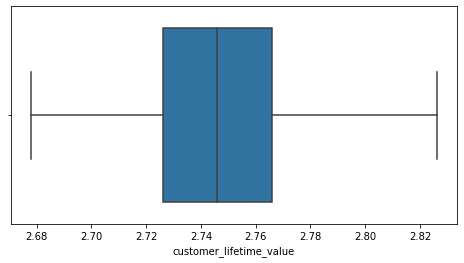

In [30]:
#check if outliers are removed
for checks in outliers:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=data[checks])

In [31]:
# normalize + standardize the numericals, convert into dataframe and give column names
X_num = data.select_dtypes(include = np.number)

transformer = Normalizer().fit(X_num)
x_normalized = transformer.transform(X_num) #gives np array, with numerical data scaled down between 0 and 1
#print(x_normalized.shape)
data_no = pd.DataFrame(x_normalized) #transform in dataframe

transformer = StandardScaler().fit(data_no) #standardize the normalized dataframe data_no
x_standardized = transformer.transform(data_no) #gives array
data_no = pd.DataFrame(x_standardized) #convert into dataframe

no_col = ['customer_lifetime_value', 'income', 'monthly_premium_auto', 'months_since_last_claim', 'months_since_policy_inception', 'number_of_open_complaints', 'number_of_policies', 'total_claim_amount']

for idx, col in enumerate(no_col): #rename columns
    data_no.rename(columns={idx:col}, inplace=True)
data_no

#is it normal that there are negatives?

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,-0.526922,0.593991,-0.487962,0.757910,-1.486647,-0.203472,-1.046030,-0.332254
1,-0.301808,-0.460345,-0.309780,-0.245903,-0.263780,-0.096162,1.143796,1.016167
2,-0.215117,0.180254,-0.249292,0.143059,-0.341819,-0.059747,-0.092282,0.197584
3,-0.296199,0.097101,-0.307832,0.107742,0.302921,-0.095342,1.051185,0.083516
4,-0.105123,0.647392,-0.060304,-0.210047,-0.077027,0.056888,-1.046030,-0.842888
...,...,...,...,...,...,...,...,...
9129,-0.802916,0.577128,-0.848824,-0.218016,0.343646,-0.423653,-0.292492,-0.964252
9130,1.505419,-0.500263,1.565798,0.775949,0.055545,1.047269,-1.046030,0.938125
9131,-0.293529,-0.030228,-0.309330,-0.572969,-0.397086,1.287923,-0.111968,0.534535
9132,1.538436,-1.382094,1.520598,2.721038,-1.491532,1.018528,1.229852,1.913758


In [32]:
#do x,y split after normalizing all numericals incl. the target value
x = data_no.drop(['total_claim_amount'], axis=1)
y = data_no['total_claim_amount']

In [33]:
y

0      -0.332254
1       1.016167
2       0.197584
3       0.083516
4      -0.842888
          ...   
9129   -0.964252
9130    0.938125
9131    0.534535
9132    1.913758
9133   -0.255692
Name: total_claim_amount, Length: 9134, dtype: float64

In [34]:
data_no

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,-0.526922,0.593991,-0.487962,0.757910,-1.486647,-0.203472,-1.046030,-0.332254
1,-0.301808,-0.460345,-0.309780,-0.245903,-0.263780,-0.096162,1.143796,1.016167
2,-0.215117,0.180254,-0.249292,0.143059,-0.341819,-0.059747,-0.092282,0.197584
3,-0.296199,0.097101,-0.307832,0.107742,0.302921,-0.095342,1.051185,0.083516
4,-0.105123,0.647392,-0.060304,-0.210047,-0.077027,0.056888,-1.046030,-0.842888
...,...,...,...,...,...,...,...,...
9129,-0.802916,0.577128,-0.848824,-0.218016,0.343646,-0.423653,-0.292492,-0.964252
9130,1.505419,-0.500263,1.565798,0.775949,0.055545,1.047269,-1.046030,0.938125
9131,-0.293529,-0.030228,-0.309330,-0.572969,-0.397086,1.287923,-0.111968,0.534535
9132,1.538436,-1.382094,1.520598,2.721038,-1.491532,1.018528,1.229852,1.913758


In [35]:
X_cat = data.select_dtypes(include = object)
X_cat

,id,state,response,coverage,education,effective_to_date,employment_status,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,No,Basic,Bachelor,2/10/11,Employed,M,Urban,Married,Personal Auto,Personal L1,Offer2,Web,Four-Door Car,Medsize
9130,PK87824,California,Yes,Extended,College,2/12/11,Employed,F,Suburban,Divorced,Corporate Auto,Corporate L3,Offer1,Branch,Four-Door Car,Medsize
9131,TD14365,California,No,Extended,Bachelor,2/6/11,Unemployed,M,Suburban,Single,Corporate Auto,Corporate L2,Offer1,Branch,Four-Door Car,Medsize
9132,UP19263,California,No,Extended,College,2/3/11,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer3,Branch,Four-Door Car,Large


In [36]:
#OneHot endoder and normalizer for numericals givs array
#Does it actually make sense to this this with all the categorical data since it gives almost 10000 columns? 
#How do I decide which categoricals to transform to numericals?


#use onehotencoder for categoricals and transform to array
#encoder = OneHotEncoder(handle_unknown='error', drop='first')
#encoder.fit(X_cat)
#encoded = encoder.transform(X_cat).toarray()
#encoded.shape
# How do I transform this into a dataframe with named columns? How can I papply hot


#use pd.concat to join the new columns with your original dataframe
for column in X_cat.columns:
    X_cat = pd.concat([X_cat,pd.get_dummies(X_cat[column], prefix=column)],axis=1)
    # now drop the original column 
    X_cat.drop([column],axis=1, inplace=True)
    
X_cat

#this gives e.g. 3 columns for 3 values for column vehicle size (vehicle_size_Large',
# 'vehicle_size_Medsize', 'vehicle_size_Small), but only 2 were needed. Why is that?

,id_AA10041,id_AA11235,id_AA16582,id_AA30683,id_AA34092,id_AA35519,id_AA56476,id_AA69265,id_AA71604,id_AA93585,id_AB13432,id_AB21519,id_AB23825,id_AB26022,id_AB31813,id_AB45325,id_AB60627,id_AB62982,id_AB69140,id_AB72731,id_AB73565,id_AB78984,id_AB96670,id_AB98823,id_AC13887,id_AC22873,id_AC24378,id_AC40767,id_AC42963,id_AC58002,id_AC67315,id_AC73173,id_AC75391,id_AC79024,id_AD12500,id_AD18174,id_AD28349,id_AD28535,id_AD33653,id_AD33971,id_AD38685,id_AD56037,id_AD63766,id_AD71478,id_AD89594,id_AD95939,id_AE23906,id_AE30506,id_AE60813,id_AE62631,id_AE74442,id_AE89300,id_AE90216,id_AE93522,id_AE98193,id_AF10970,id_AF17671,id_AF20716,id_AF36894,id_AF37776,id_AF41118,id_AF47139,id_AF48816,id_AF49027,id_AF49625,id_AF69537,id_AF81450,id_AG22225,id_AG32304,id_AG39150,id_AG45299,id_AG47947,id_AG56998,id_AG58599,id_AG62087,id_AG62140,id_AG85127,id_AG85615,id_AH17051,id_AH22694,id_AH39293,id_AH41065,id_AH41449,id_AH53588,id_AH55475,id_AH58807,id_AH65907,id_AH84063,id_AH89786,id_AH92481,id_AH97088,id_AH99727,id_AI11191,id_AI14767,id_AI16519,id_AI47152,id_AI49188,id_AI49712,id_AI58313,id_AI58500,id_AI61368,id_AI74959,id_AI85843,id_AJ32539,id_AJ58038,id_AJ69060,id_AJ69778,id_AJ89107,id_AJ89108,id_AK11669,id_AK11719,id_AK17025,id_AK44985,id_AK46006,id_AK54675,id_AK59340,id_AK61491,id_AK72422,id_AK90865,id_AL21967,id_AL27471,id_AL35726,id_AL43475,id_AL43715,id_AL46984,id_AL50693,id_AL78075,id_AL95338,id_AL96740,id_AM17304,id_AM26598,id_AM26717,id_AM28777,id_AM29546,id_AM30008,id_AM32820,id_AM34581,id_AM36670,id_AM52614,id_AM53473,id_AM57175,id_AM72411,id_AM79057,id_AM88377,id_AM89558,id_AM92343,id_AM94127,id_AM97901,id_AM99192,id_AN21193,id_AN32867,id_AN36757,id_AN47199,id_AN53225,id_AN57220,id_AN67558,id_AN79079,id_AN80983,id_AN97123,id_AO20938,id_AO40386,id_AO42003,id_AO46433,id_AO74776,id_AO77635,id_AO87348,id_AO98601,id_AP23850,id_AP27994,id_AP32891,id_AP34711,id_AP46166,id_AP47670,id_AP52126,id_AP52565,id_AP56340,id_AP59947,id_AP63665,id_AP65984,id_AP66226,id_AP67935,id_AP89323,id_AP90638,id_AP95078,id_AP98768,id_AQ11656,id_AQ25590,id_AQ30231,id_AQ34238,id_AQ46199,id_AQ51159,id_AQ51368,id_AQ52711,id_AQ70385,id_AQ70619,id_AQ91207,id_AQ94108,id_AR17553,id_AR25213,id_AR40217,id_AR47849,id_AR59416,id_AR61426,id_AR63478,id_AR69517,id_AR75105,id_AR83514,id_AR96516,id_AR99766,id_AS17174,id_AS18084,id_AS26192,id_AS48176,id_AS55478,id_AS55677,id_AS60178,id_AS62048,id_AS77287,id_AS78838,id_AS93181,id_AS97690,id_AS99827,id_AT13963,id_AT18041,id_AT24793,id_AT26484,id_AT29024,id_AT30076,id_AT31367,id_AT33529,id_AT36002,id_AT41276,id_AT49447,id_AT52647,id_AT55072,id_AT62618,id_AT72574,id_AT79008,id_AT84725,id_AT86990,id_AT89553,id_AT93647,id_AT98182,id_AU11344,id_AU13233,id_AU23837,id_AU45793,id_AU46443,id_AU46604,id_AU62013,id_AU71562,id_AU75025,id_AU77281,id_AU91447,id_AU94279,id_AU96286,id_AU98438,id_AV17528,id_AV25133,id_AV49798,id_AV72430,id_AV76907,id_AV93209,id_AV96010,id_AW17574,id_AW18068,id_AW27717,id_AW36627,id_AW48347,id_AW71157,id_AW73065,id_AW77988,id_AW84946,id_AW86033,id_AX10148,id_AX28231,id_AX36597,id_AX38728,id_AX39008,id_AX45422,id_AX56708,id_AX70794,id_AX71238,id_AX71707,id_AX86150,id_AX86552,id_AX99820,id_AY18433,id_AY19539,id_AY26056,id_AY29281,id_AY30324,id_AY35050,id_AY35539,id_AY40674,id_AY43037,id_AY52869,id_AY55759,id_AY59197,id_AY73718,id_AY84441,id_AY88788,id_AY98473,id_AY99324,id_AZ15952,id_AZ29426,id_AZ31562,id_AZ34845,id_AZ36763,id_AZ38648,id_AZ43057,id_AZ50087,id_AZ62651,id_AZ64856,id_AZ68072,id_AZ68184,id_AZ74055,id_AZ75509,id_AZ77669,id_AZ82578,id_AZ84403,id_AZ87715,id_AZ90068,id_AZ95587,id_BA17836,id_BA19651,id_BA26944,id_BA38428,id_BA40043,id_BA49679,id_BA51898,id_BA52133,id_BA56812,id_BA66627,id_BA75404,id_BA87048,id_BA87216,id_BA92673,id_BA97018,id_BB10681,id_BB11622,id_BB19609,id_BB21794,id_BB41401,id_BB48165,id_BB65725,id_BB82067,id_BC31913,id_BC34309,id_BC35753,id_BC43958,id_BC47264,id_BC48076,id_BC51708,id_BC52397,id_BC53363,id_BC53546,id_BC62782,id_BC64697,id_BC66536,id_BC66921,id_BC75105,id_BC77846,id_BC8

In [37]:
#concacenate dataframes 
data_F = pd.concat([X_cat, data_no], axis=1)  # using normalized and one-hot encoded data
data_F

,id_AA10041,id_AA11235,id_AA16582,id_AA30683,id_AA34092,id_AA35519,id_AA56476,id_AA69265,id_AA71604,id_AA93585,id_AB13432,id_AB21519,id_AB23825,id_AB26022,id_AB31813,id_AB45325,id_AB60627,id_AB62982,id_AB69140,id_AB72731,id_AB73565,id_AB78984,id_AB96670,id_AB98823,id_AC13887,id_AC22873,id_AC24378,id_AC40767,id_AC42963,id_AC58002,id_AC67315,id_AC73173,id_AC75391,id_AC79024,id_AD12500,id_AD18174,id_AD28349,id_AD28535,id_AD33653,id_AD33971,id_AD38685,id_AD56037,id_AD63766,id_AD71478,id_AD89594,id_AD95939,id_AE23906,id_AE30506,id_AE60813,id_AE62631,id_AE74442,id_AE89300,id_AE90216,id_AE93522,id_AE98193,id_AF10970,id_AF17671,id_AF20716,id_AF36894,id_AF37776,id_AF41118,id_AF47139,id_AF48816,id_AF49027,id_AF49625,id_AF69537,id_AF81450,id_AG22225,id_AG32304,id_AG39150,id_AG45299,id_AG47947,id_AG56998,id_AG58599,id_AG62087,id_AG62140,id_AG85127,id_AG85615,id_AH17051,id_AH22694,id_AH39293,id_AH41065,id_AH41449,id_AH53588,id_AH55475,id_AH58807,id_AH65907,id_AH84063,id_AH89786,id_AH92481,id_AH97088,id_AH99727,id_AI11191,id_AI14767,id_AI16519,id_AI47152,id_AI49188,id_AI49712,id_AI58313,id_AI58500,id_AI61368,id_AI74959,id_AI85843,id_AJ32539,id_AJ58038,id_AJ69060,id_AJ69778,id_AJ89107,id_AJ89108,id_AK11669,id_AK11719,id_AK17025,id_AK44985,id_AK46006,id_AK54675,id_AK59340,id_AK61491,id_AK72422,id_AK90865,id_AL21967,id_AL27471,id_AL35726,id_AL43475,id_AL43715,id_AL46984,id_AL50693,id_AL78075,id_AL95338,id_AL96740,id_AM17304,id_AM26598,id_AM26717,id_AM28777,id_AM29546,id_AM30008,id_AM32820,id_AM34581,id_AM36670,id_AM52614,id_AM53473,id_AM57175,id_AM72411,id_AM79057,id_AM88377,id_AM89558,id_AM92343,id_AM94127,id_AM97901,id_AM99192,id_AN21193,id_AN32867,id_AN36757,id_AN47199,id_AN53225,id_AN57220,id_AN67558,id_AN79079,id_AN80983,id_AN97123,id_AO20938,id_AO40386,id_AO42003,id_AO46433,id_AO74776,id_AO77635,id_AO87348,id_AO98601,id_AP23850,id_AP27994,id_AP32891,id_AP34711,id_AP46166,id_AP47670,id_AP52126,id_AP52565,id_AP56340,id_AP59947,id_AP63665,id_AP65984,id_AP66226,id_AP67935,id_AP89323,id_AP90638,id_AP95078,id_AP98768,id_AQ11656,id_AQ25590,id_AQ30231,id_AQ34238,id_AQ46199,id_AQ51159,id_AQ51368,id_AQ52711,id_AQ70385,id_AQ70619,id_AQ91207,id_AQ94108,id_AR17553,id_AR25213,id_AR40217,id_AR47849,id_AR59416,id_AR61426,id_AR63478,id_AR69517,id_AR75105,id_AR83514,id_AR96516,id_AR99766,id_AS17174,id_AS18084,id_AS26192,id_AS48176,id_AS55478,id_AS55677,id_AS60178,id_AS62048,id_AS77287,id_AS78838,id_AS93181,id_AS97690,id_AS99827,id_AT13963,id_AT18041,id_AT24793,id_AT26484,id_AT29024,id_AT30076,id_AT31367,id_AT33529,id_AT36002,id_AT41276,id_AT49447,id_AT52647,id_AT55072,id_AT62618,id_AT72574,id_AT79008,id_AT84725,id_AT86990,id_AT89553,id_AT93647,id_AT98182,id_AU11344,id_AU13233,id_AU23837,id_AU45793,id_AU46443,id_AU46604,id_AU62013,id_AU71562,id_AU75025,id_AU77281,id_AU91447,id_AU94279,id_AU96286,id_AU98438,id_AV17528,id_AV25133,id_AV49798,id_AV72430,id_AV76907,id_AV93209,id_AV96010,id_AW17574,id_AW18068,id_AW27717,id_AW36627,id_AW48347,id_AW71157,id_AW73065,id_AW77988,id_AW84946,id_AW86033,id_AX10148,id_AX28231,id_AX36597,id_AX38728,id_AX39008,id_AX45422,id_AX56708,id_AX70794,id_AX71238,id_AX71707,id_AX86150,id_AX86552,id_AX99820,id_AY18433,id_AY19539,id_AY26056,id_AY29281,id_AY30324,id_AY35050,id_AY35539,id_AY40674,id_AY43037,id_AY52869,id_AY55759,id_AY59197,id_AY73718,id_AY84441,id_AY88788,id_AY98473,id_AY99324,id_AZ15952,id_AZ29426,id_AZ31562,id_AZ34845,id_AZ36763,id_AZ38648,id_AZ43057,id_AZ50087,id_AZ62651,id_AZ64856,id_AZ68072,id_AZ68184,id_AZ74055,id_AZ75509,id_AZ77669,id_AZ82578,id_AZ84403,id_AZ87715,id_AZ90068,id_AZ95587,id_BA17836,id_BA19651,id_BA26944,id_BA38428,id_BA40043,id_BA49679,id_BA51898,id_BA52133,id_BA56812,id_BA66627,id_BA75404,id_BA87048,id_BA87216,id_BA92673,id_BA97018,id_BB10681,id_BB11622,id_BB19609,id_BB21794,id_BB41401,id_BB48165,id_BB65725,id_BB82067,id_BC31913,id_BC34309,id_BC35753,id_BC43958,id_BC47264,id_BC48076,id_BC51708,id_BC52397,id_BC53363,id_BC53546,id_BC62782,id_BC64697,id_BC66536,id_BC66921,id_BC75105,id_BC77846,id_BC8

## 05 - Modeling

In [38]:
# traint-test split: y = normalized
X_train, X_test, y_train, y_test = train_test_split(data_F, y, test_size=0.3, random_state=42)


Apply model.

In [39]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [40]:
predictions  = model.predict(X_test)
predictions.shape

(2741,)

## 06 - Model Validation

- R2.
- MSE.
- RMSE.
- MAE.

In [41]:
r2 = r2_score(y_test, predictions)
print("R2:", r2)

#can this be? 99% ?

R2: 0.9999993255877403


In [42]:
mse = mean_squared_error(y_test, predictions, squared=True)
print("MSE:", mse)

#How can I interprete this result?

MSE: 6.692479174927685e-07


In [43]:
rmse = mean_squared_error(y_test, predictions, squared=False)
print("RMSE:", rmse)

RMSE: 0.0008180757406822234


In [44]:
mae = mean_absolute_error(y_test, predictions)
print("MAE:", mse)

MAE: 6.692479174927685e-07


## 07 - Reporting

Present results.

#How? 
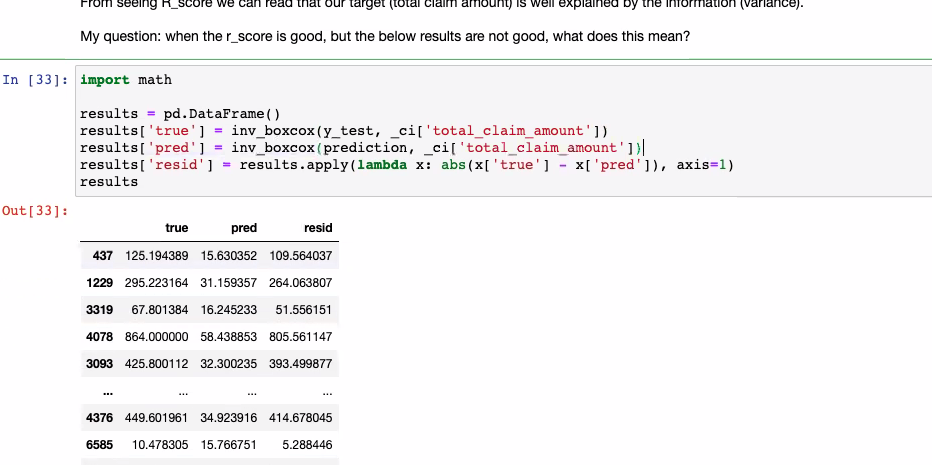

compare true values and predicted values (either box boxcx transform or both inverted)


In [47]:
import math
results = pd.DataFrame()

results['true'] = inv_boxcox(y_test, _ci['total_claim_amount'])
results['pred'] = inv_boxcox(predictions, _ci['total_claim_amount'])
results['resid'] = results.apply(lambda x: abs(x['true'] - x['pred']), axis=1)
results

,true,pred,resid
708,0.291285,0.290844,0.000441
47,2.355619,2.354660,0.000959
3995,0.440980,0.441425,0.000446
1513,0.446306,0.446250,0.000056
3686,2.403512,2.401336,0.002176
...,...,...,...
4271,0.564026,0.564984,0.000958
7923,1.328571,1.328871,0.000300
5633,0.708791,0.709475,0.000684
8432,0.317185,0.316633,0.000552
